<a href="https://colab.research.google.com/github/PDBeurope/pdbe-notebooks/blob/main/pdbe_ligands_tutorials/PDBe_KB_API_tutorials.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>








![](https://wwwdev.ebi.ac.uk/pdbe/sites/default/files/inline-images/PDBE-KB_logo_2019_black_text.png)

# Answering scientific questions using PDBe-KB API end-points

## Introduction

Welcome to this Google Colab notebook, showcasing accessing PDBe-KB data programatically.



This notebook serves as a practical resource for researchers, developers, and data enthusiasts who are interested in exploring the potential of the PDBe-KB API and leveraging its capabilities for large-scale data analysis. By following this guide, you will gain a deep understanding of how to answer various scientific questions using PDBe-KB API and automate your workflow.


**Further readings:**

**PDBe-KB consortium, PDBe-KB: collaboratively defining the biological context of structural data , Nucleic Acids Research, Database Issue (2022)**
https://doi.org/10.1093/nar/gkab988

**PDBe and PDBe-KB: Providing high-quality, up-to-date and integrated resources of macromolecular structures to support basic and applied research and education**
https://doi.org/10.1002/pro.4439




  ## Instructions <a name="Instructions"></a>

* Quick Start <a name="Quick Start"></a>

In order to make the learning experience more accessible and interactive, we have incorporated widgets that allow you to provide inputs and customize certain aspects of the code. These widgets serve as interactive elements that enhance your ability to interact with the code and observe the impact of different inputs on the results. Throughout this tutorial, you will come across code chunks that include these interactive widgets.

  * How to use Google Colab <a name="Google Colab"></a>
1. To run a code cell, click on the cell to select it. You will notice a play button (▶) on the left side of the cell. Click on the play button or press Shift+Enter to run the code in the selected cell.
2. The code will start executing, and you will see the output, if any, displayed below the code cell.
3. Move to the next code cell and repeat steps 2 and 3 until you have executed all the desired code cells in sequence.
4. The currently running step is indicated by a circle with a stop sign next to it.
If you need to stop or interrupt the execution of a code cell, you can click on the stop button (■) located next to the play button.

*Remember to run the code cells in the correct order, as their execution might depend on variables or functions defined in previous cells. You can modify the code in a code cell and re-run it to see updated results.*

## Contact us

Requests for clarifications or reporting bugs can be made via pdbehelp@ebi.ac.uk.


## &nbsp; Set up

* The code below will install and import all neccessary packages.
* We have defined functions for easier functionality.


In [ ]:
#@title Install dependencies
!pip install requests pandas numpy matplotlib IPython &> /dev/null

In [ ]:
#@title Setting for PDBe-KB API
base_url = "https://www.ebi.ac.uk/pdbe/"  # the beginning of the URL for PDBe's API.
search_url = base_url + 'search/pdb/select?'  # the rest of the URL used for PDBe's search API.

pdbe_kb_interacting_residues_api = base_url + "graph-api/uniprot/ligand_sites/"
pdbe_kb_api_uniprot_base_url = base_url + "graph-api/uniprot/"
pdbe_kb_api_ligand_base_url = base_url + "graph-api/compound/"

##&nbsp; 1. Ligand interactions

Let's find all the ligands and its interaction details bound to a given protein.


###1.1 Getting all the ligand binding residues

In [ ]:
# Getting all the ligand binding resdiues
import pandas as pd
import requests, json
from google.colab import data_table

# Enable extension that renders pandas dataframes into interactive displays that can be filtered, sorted, and explored dynamically.
data_table.enable_dataframe_formatter()

def make_table(my_df) :
  """
  Make interactive table in colab
  """
  return data_table.DataTable(my_df,include_index=False, num_rows_per_page=5, max_columns=2000,max_rows=100000)

def get_url(url):
    """
    Makes a request to a URL. Returns a JSON of the results
    :param str url:
    :return dict:
    """
    response = requests.get(url)

    if response.status_code == 200:
        return response.json()
    else:
        print("[No data retrieved - %s] %s" % (response.status_code, response.text))

    return {}


# get ligand binding residues for a UniProt accession
def get_ligand_site_data(uniprot_accession):
    """
    This function takes UniProt accession as an input and gives following output
    1. Gets all the ligand binding residues for a given accession from PDBe-KB API
    2. Calculates interaction ratio i.e. the proportion of PDB entries that show an interaction between the residue and the specific ligand.
    """
    url = f"{pdbe_kb_api_uniprot_base_url}/ligand_sites/{uniprot_accession}"
    print(f"Getting data from {url}")
    print(f"To know exact details of the columns in the following table refer to https://www.ebi.ac.uk/pdbe/graph-api/pdbe_doc/#api-UniProt-GetUNPLigandSites")
    data = get_url(url=url)
    data_to_ret = []
    for data_uniprot_accession in data:
        accession_data = data.get(data_uniprot_accession)
        for row in accession_data.get('data'):
            ligand_accession = row.get('accession')
            name = row.get('name')
            num_atoms = row.get('additionalData', {}).get('numAtoms')
            for residue in row.get('residues', []):
                residue['ligand_accession'] = ligand_accession
                residue['ligand_name'] = name
                residue['ligand_num_atoms'] = num_atoms
                residue['uniprot_accession'] = uniprot_accession
                # interaction ratio = total no. of PDB entries where given residue interacts/total PDB that bind to that ligand
                residue['interaction_ratio'] = len(residue.get('interactingPDBEntries', [])) / len(
                    residue.get('allPDBEntries', []))
                data_to_ret.append(residue)
    return data_to_ret

def explode_dataset(result, column_to_explode=None):
    """
    Convert the JSON format into pandas dataframe,
    by "exploding" specified columns or all columns with object data type.
    The term "explode" refers to the process of converting elements in a list-like object into separate rows.
    """
    df = pd.DataFrame(result)
    if column_to_explode:
        df = df.explode(column=column_to_explode).reset_index(drop=True)
    else:
        for column in df.select_dtypes(include='object'):
            df = df.explode(column=column).reset_index(drop=True)
    return df

We will get ligands for the Human Acetylcholinesterase, which has the UniProt accession P22303.

In [ ]:
uniprot_accession = 'P22303'
# get the ligand interaction data from PDBe-KB API
ligand_data=get_ligand_site_data(uniprot_accession)
# convert the data into pandas dataframe
df=explode_dataset(ligand_data,column_to_explode='interactingPDBEntries')
# display the dataframe in interactive table
print(f"Displaying all the ligand binding residues for the {uniprot_accession} in an interactive table")
make_table(df)


Getting data from https://www.ebi.ac.uk/pdbe/graph-api/uniprot//ligand_sites/P22303
To know exact details of the columns in the following table refer to https://www.ebi.ac.uk/pdbe/graph-api/pdbe_doc/#api-UniProt-GetUNPLigandSites
Displaying all the ligand binding residues for the P22303 in an interactive table


,startIndex,endIndex,startCode,endCode,indexType,interactingPDBEntries,allPDBEntries,ligand_accession,ligand_name,ligand_num_atoms,uniprot_accession,interaction_ratio
0,113,113,GLY,GLY,UNIPROT,"{'pdbId': '7xn1', 'entityId': 1, 'chainIds': 'B'}",[7xn1],THA,TACRINE,15,P22303,1.000000
1,114,114,THR,THR,UNIPROT,"{'pdbId': '7xn1', 'entityId': 1, 'chainIds': 'B'}",[7xn1],THA,TACRINE,15,P22303,1.000000
2,117,117,TRP,TRP,UNIPROT,"{'pdbId': '7xn1', 'entityId': 1, 'chainIds': 'B'}",[7xn1],THA,TACRINE,15,P22303,1.000000
3,233,233,GLU,GLU,UNIPROT,"{'pdbId': '7xn1', 'entityId': 1, 'chainIds': 'A'}",[7xn1],THA,TACRINE,15,P22303,1.000000
4,368,368,TYR,TYR,UNIPROT,"{'pdbId': '7xn1', 'entityId': 1, 'chainIds': 'B'}",[7xn1],THA,TACRINE,15,P22303,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2091,559,559,ALA,ALA,UNIPROT,"{'pdbId': '2x8b', 'entityId': 1, 'chainIds': 'A'}","[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.555556
2092,562,562,PHE,PHE,UNIPROT,"{'pdbId': '7p1p', 'entityId': 2, 'chainIds': 'B'}","[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.222222
2093,562,562,PHE,PHE,UNIPROT,"{'pdbId': '7p1n', 'entityId': 2, 'chainIds': 'A'}","[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.222222
2094,565,565,ARG,ARG,UNIPROT,"{'pdbId': '6f25', 'entityId': 1, 'chainIds': 'A'}","[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.111111


The interactingPDBEntries column is in dictionary data structure. Let's do some post processing is to separate interactingPDBEntries into separate columns of pdbId, entitityId and chainIds.

In [ ]:
# convert the dictionary into a table
data = pd.json_normalize(df['interactingPDBEntries'])
#print(data)
# now join these columns into previous dataframe and get rid of old dictionary column
df2 = df.join(data).drop(columns='interactingPDBEntries')
make_table(df2)


,startIndex,endIndex,startCode,endCode,indexType,allPDBEntries,ligand_accession,ligand_name,ligand_num_atoms,uniprot_accession,interaction_ratio,pdbId,entityId,chainIds
0,113,113,GLY,GLY,UNIPROT,[7xn1],THA,TACRINE,15,P22303,1.000000,7xn1,1,B
1,114,114,THR,THR,UNIPROT,[7xn1],THA,TACRINE,15,P22303,1.000000,7xn1,1,B
2,117,117,TRP,TRP,UNIPROT,[7xn1],THA,TACRINE,15,P22303,1.000000,7xn1,1,B
3,233,233,GLU,GLU,UNIPROT,[7xn1],THA,TACRINE,15,P22303,1.000000,7xn1,1,A
4,368,368,TYR,TYR,UNIPROT,[7xn1],THA,TACRINE,15,P22303,1.000000,7xn1,1,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2091,559,559,ALA,ALA,UNIPROT,"[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.555556,2x8b,1,A
2092,562,562,PHE,PHE,UNIPROT,"[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.222222,7p1p,2,B
2093,562,562,PHE,PHE,UNIPROT,"[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.222222,7p1n,2,A
2094,565,565,ARG,ARG,UNIPROT,"[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.111111,6f25,1,A


startIndex and endIndex are the UniProt residue number, so we'll make a new column called residue_number and copy the startIndex there. We are also going to "count" the number of results - so we'll make a dummy count column to store it in

In [ ]:
df2['residue_number'] = df2['startIndex']
df2['interactions_count'] = df2['pdbId']

Now we are ready to use the data.

In [ ]:
make_table(df2)

,startIndex,endIndex,startCode,endCode,indexType,allPDBEntries,ligand_accession,ligand_name,ligand_num_atoms,uniprot_accession,interaction_ratio,pdbId,entityId,chainIds,residue_number,interactions_count
0,113,113,GLY,GLY,UNIPROT,[7xn1],THA,TACRINE,15,P22303,1.000000,7xn1,1,B,113,7xn1
1,114,114,THR,THR,UNIPROT,[7xn1],THA,TACRINE,15,P22303,1.000000,7xn1,1,B,114,7xn1
2,117,117,TRP,TRP,UNIPROT,[7xn1],THA,TACRINE,15,P22303,1.000000,7xn1,1,B,117,7xn1
3,233,233,GLU,GLU,UNIPROT,[7xn1],THA,TACRINE,15,P22303,1.000000,7xn1,1,A,233,7xn1
4,368,368,TYR,TYR,UNIPROT,[7xn1],THA,TACRINE,15,P22303,1.000000,7xn1,1,B,368,7xn1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2091,559,559,ALA,ALA,UNIPROT,"[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.555556,2x8b,1,A,559,2x8b
2092,562,562,PHE,PHE,UNIPROT,"[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.222222,7p1p,2,B,562,7p1p
2093,562,562,PHE,PHE,UNIPROT,"[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.222222,7p1n,2,A,562,7p1n
2094,565,565,ARG,ARG,UNIPROT,"[6o5r, 2x8b, 7p1n, 8aen, 7p1p, 4bdt, 8aev, 6f2...",CL,CHLORIDE ION,1,P22303,0.111111,6f25,1,A,565,6f25


###1.2 Selecting residues based on their ligand interactions
We will begin by assessing the interaction ratio, which provides insights into the consistency of a residue's interaction with a ligand across various protein structures. A higher interaction ratio signifies that the residue consistently interacts with the ligand in the binding site, indicating its vital role in ligand binding. Conversely, a lower interaction ratio suggests that the residue's interaction with the ligand may be less consistent or context-dependent.

Calculating the interaction ratio for each residue within a ligand binding site can help identify the residues that consistently participate in the binding of a specific ligand. This information is valuable for understanding the crucial interactions between the ligand and the protein, potentially guiding further studies or facilitating drug design efforts focused on that particular binding site.

Ligands that consistently interact with well-defined residues across all Protein Data Bank (PDB) entries will have an interaction ratio of 1.0. Let's proceed to identify such ligands.

In [ ]:
ret = df2.query('interaction_ratio == 1.0')['ligand_accession'].unique()
ret

array(['THA', 'AA', '4IX', '4J1', '3VI', 'HLO', 'HI6', 'LND', 'CVZ',
       'E20', 'H0R', 'H1R', 'H0L', '1YK', '1YL', 'LWU', 'EBW', 'QRH',
       'FP1', 'HUP', 'MES', 'PQY', 'FUL', 'PQV', 'WW2', 'UCY', 'GNT',
       'HUW', 'BR', '1PE', 'PE8', '7PE', 'EFS', 'ELT', 'PEG', 'UCJ',
       'GD8', 'NWA', 'EDO', 'DEP', 'L2Y', 'L1M', 'L0S', 'VX'],
      dtype=object)


Let's examine if we can filter ligands based on their interactions with residues that have the highest number of interactions. To begin, we'll assess the total number of interactions per residue.

<Axes: xlabel='residue_number', ylabel='interactions_count'>

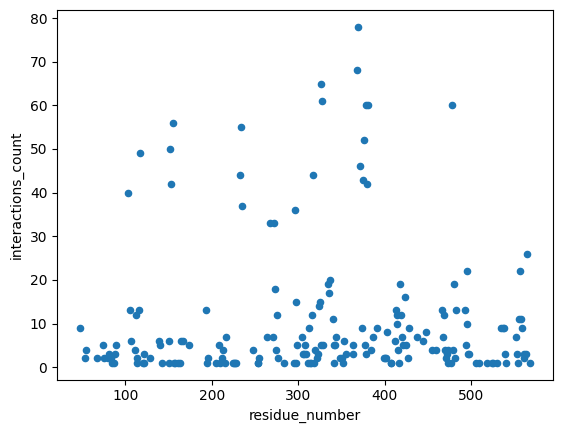

In [ ]:
df3 = df2.groupby('residue_number')['interactions_count'].count().reset_index()
# let's plot a scatter plot
df3.plot.scatter(x='residue_number', y='interactions_count')

We can the determine the mean number of interactions and the standard deviation

In [ ]:
mean = df3["interactions_count"].mean()
std = df3["interactions_count"].std()
print(f"Mean:{round(mean,2)}")
print(f"Standard deviation:{round(std,3)}")

Mean:10.8
Standard deviation:15.796


Let's plot residues which have more interactions than the mean in red and those which are equal to or below in blue.

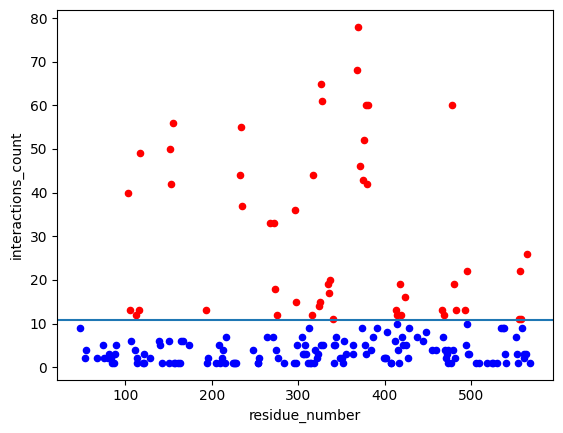

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots() # this makes one plot with an axis "ax" which we can add several plots to
df3.query('interactions_count <= {}'.format(mean)).plot.scatter(x='residue_number', y='interactions_count', color='blue', ax=ax)
df3.query('interactions_count > {}'.format(mean)).plot.scatter(x='residue_number', y='interactions_count', color='red', ax=ax)
ax.axhline(mean)
plt.show()
plt.close()

A higher threshold (two standard deviations) would be more useful to select only the most common ligand-binding residues.

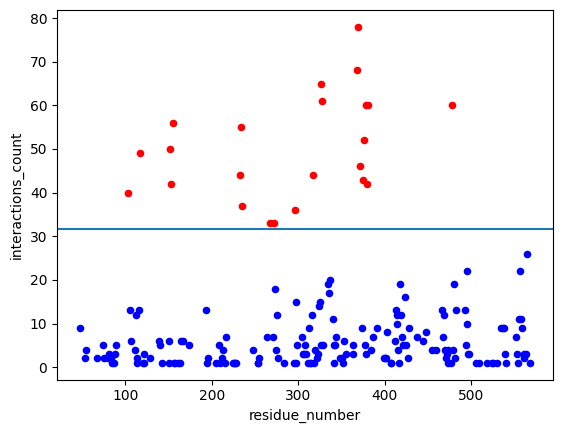

In [ ]:
two_std_value = std * 2
fig, ax = plt.subplots() # this makes one plot with an axis "ax" which we can add several plots to
df3.query('interactions_count <= {}'.format(two_std_value)).plot.scatter(x='residue_number', y='interactions_count', color='blue', ax=ax)
df3.query('interactions_count > {}'.format(two_std_value)).plot.scatter(x='residue_number', y='interactions_count', color='red', ax=ax)
ax.axhline(two_std_value)
plt.show()
plt.close()

Let's find out all the different types of ligands interacting with the residues highlighted red.

In [ ]:
all_data_over_two_std = df3.query('interactions_count > {}'.format(two_std_value)).sort_values(by='interactions_count', ascending=False)
residue_numbers_over_two_std=all_data_over_two_std["residue_number"]
interesting_ligands  = df2[df2['residue_number'].isin(residue_numbers_over_two_std)]["ligand_accession"].unique()
print(interesting_ligands)



['THA' 'AA' '4IX' '4J1' '3VI' 'HLO' 'HI6' 'LND' 'CVZ' 'E20' 'H0R' 'H1R'
 'H0L' '1YK' '1YL' 'LWU' 'EBW' 'QRH' 'FP1' 'HUP' 'MES' 'PQY' 'FUL' 'FUC'
 'NAG' 'PQV' 'WW2' 'UCY' 'GNT' 'HUW' 'GOL' 'ZN' '1PE' 'PE8' '7PE' 'EFS'
 'ELT' 'UCJ' 'GD8' 'NWA' 'DMS' 'DEP' 'L2Y' 'L1M' 'L0S' 'NO3' 'VX' 'SO4'
 'CL']


It's also worth seeing which ligands are not in our interesting ligands list.

In [ ]:
all_ligands = list(df2['ligand_accession'].unique())

missing_ligands = [x for x in all_ligands if x not in interesting_ligands]
missing_ligands

['GAL', 'SIA', 'BR', 'PEG', 'EDO', 'MG']

Let's select only ligands which interact the most.

For this we will aggregating Mean Interaction Ratios for Residue-Ligand Combinations. In the table generated below, each row will represent a unique combination of 'residue_number' and 'ligand_accession', with the 'interaction_ratio' column containing the mean value of 'interaction_ratio' for all rows in that particular group. This operation is useful for summarizing and obtaining the average interaction ratio for each combination of residue and ligand in the original DataFrame.

In [ ]:
df4 = df2.groupby(['residue_number', 'ligand_accession'])['interaction_ratio'].mean().reset_index()

In [ ]:
make_table(df4)


,residue_number,ligand_accession,interaction_ratio
0,47,CL,0.555556
1,47,SO4,0.400000
2,53,CL,0.111111
3,53,SO4,0.100000
4,54,CL,0.222222
...,...,...,...
737,565,EDO,1.000000
738,565,MG,0.250000
739,565,NO3,0.315789
740,565,SO4,0.600000


Let's enhance the data in the DataFrame to facilitate better analysis and visualization of the interaction_ratio. To achieve this, we will apply a scaling process using a lambda function. This lambda function will take each value in the 'interaction_ratio' column (referred to as 'x') and multiply it by 4. As a result, the 'interaction_ratio' values will be quadrupled, allowing us to gain clearer insights when visualizing the data.

In [ ]:
df4['interaction_ratio'] = df4['interaction_ratio'].apply(lambda x: x*4)

Now we can plot the ligand interactions of those ligands which interact with the most interacting residues.

We will put each ligand on a row and scale the interactions by the percentage of PDB entries they are seen in.

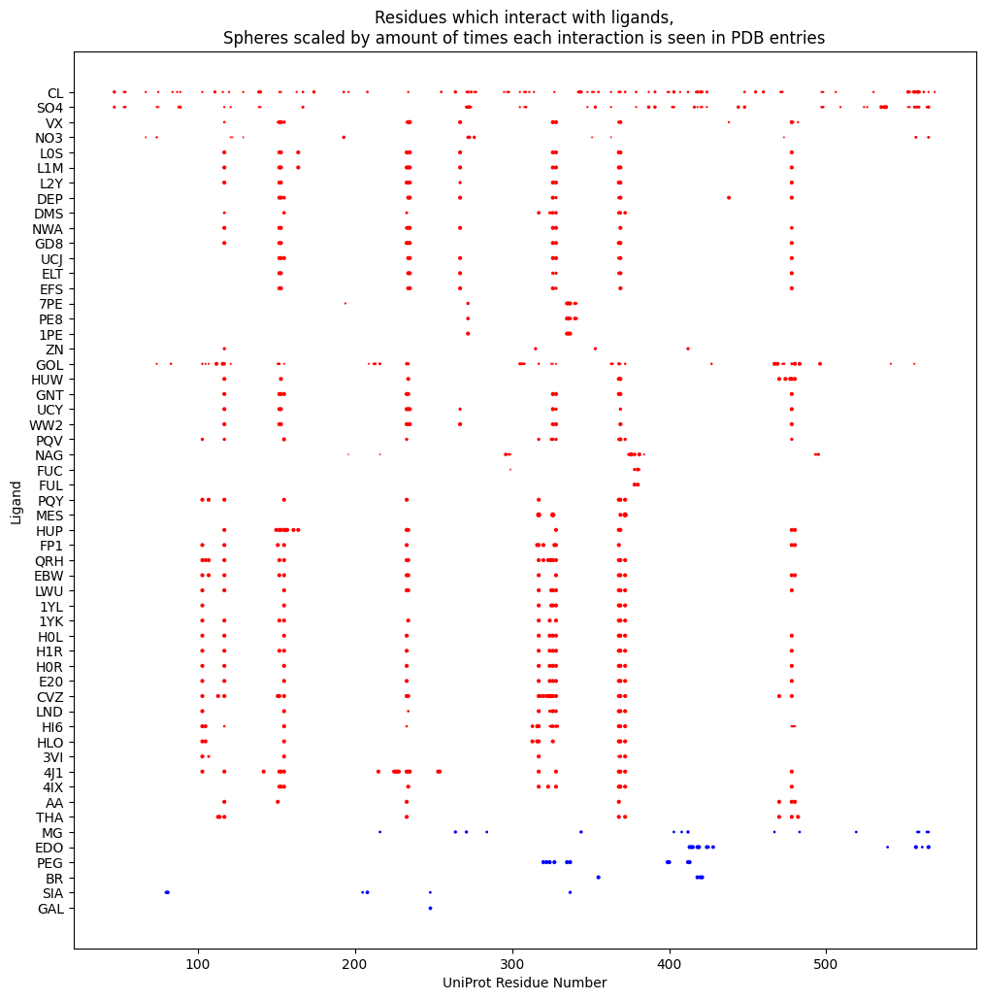

In [ ]:
# prepare a figure
plt.rcParams['figure.figsize'] = [12, 12]
fig, ax = plt.subplots()

# plot the less interesting ligands in blue
for ligand in missing_ligands:
    data = df4[df4['ligand_accession'] == ligand]
    data.plot.scatter(x='residue_number', y='ligand_accession', ax=ax, s='interaction_ratio', c='blue')

# plot the interesting ligands in red
for ligand in interesting_ligands:
    data = df4[df4['ligand_accession'] == ligand]
    data.plot.scatter(x='residue_number', y='ligand_accession', ax=ax, s='interaction_ratio', c='red')


plt.ylabel('Ligand')
plt.xlabel('UniProt Residue Number')
plt.title('Residues which interact with ligands,\nSpheres scaled by amount of times each interaction is seen in PDB entries')
plt.show()
plt.close()

###1.3 Selecting bound ligands based on their functional role
Selecting ligands based on their functional annotations
PDBe-KB annotates ligands as drug-like, co-factor-like or reactant-like. This mapping is based on mapping to DrugBank, similarity with co-factor templates or ChEBI/Rhea databases. Let's see if any of these interesting_ligands we found has any functional role.

In [ ]:
# get ligand annotations from PDBe-KB

def get_ligand_role_data(uniprot_accession):
    url = f"{pdbe_kb_api_uniprot_base_url}/ligands/{uniprot_accession}"
    print(f"Getting the data from {url}")
    my_data = get_url(url=url)
    data = my_data[uniprot_accession]
    data_to_ret = []
    for ligand_row in data :
        #print(ligand_row)
        for ligand in ligand_row :
            dict1=ligand_row[ligand]
            dict1['pdbs'] = ",".join(dict1['pdbs'])
            dict1['acts_as'] = ",".join([item.strip() for item in dict1['acts_as']])
            dict2 = {"ligand_accession":ligand}
            dict3 = {k:v for d in (dict1,dict2) for k,v in d.items()}
            #print(dict3)
            data_to_ret.append(dict3)
    return data_to_ret

data=get_ligand_role_data(uniprot_accession)
df5=explode_dataset(data)
make_table(df5)

Getting the data from https://www.ebi.ac.uk/pdbe/graph-api/uniprot//ligands/P22303


,name,pdbs,acts_as,scaffold_id,fragments,directly_interacts,ligand_accession
0,HUPRINE W,4bdt,,C1=C[C@@H]2Cc3nc4ccccc4cc3[C@H](C1)C2,c1ccccc1,True,HUW
1,HUPRINE W,4bdt,,C1=C[C@@H]2Cc3nc4ccccc4cc3[C@H](C1)C2,c1ccc2ncccc2c1,True,HUW
2,HUPRINE W,4bdt,,C1=C[C@@H]2Cc3nc4ccccc4cc3[C@H](C1)C2,c1ccncc1,True,HUW
3,(-)-GALANTHAMINE,4ey6,drug-like,C1=C[C@@]23CCNCc4cccc(c42)O[C@H]3CC1,c1ccccc1,True,GNT
4,(-)-GALANTHAMINE,4ey6,drug-like,C1=C[C@@]23CCNCc4cccc(c42)O[C@H]3CC1,c1ccc2c(c1)CCO2,True,GNT
...,...,...,...,...,...,...,...
80,BROMIDE ION,6zwe,,None,NaN,True,BR
81,PENTAETHYLENE GLYCOL,5fpq,,None,NaN,True,1PE
82,"(1R)-1,2,2-TRIMETHYLPROPYL (S)-METHYLPHOSPHINATE",6wvo,,None,NaN,True,GD8
83,UNKNOWN ATOM OR ION,2x8b,,None,NaN,False,UNX


Let's filter all the ligand which have any functional role



In [ ]:
# find all the ligand which have any functional role
df6=df5[df5['acts_as']!='']
make_table(df6)

,name,pdbs,acts_as,scaffold_id,fragments,directly_interacts,ligand_accession
3,(-)-GALANTHAMINE,4ey6,drug-like,C1=C[C@@]23CCNCc4cccc(c42)O[C@H]3CC1,c1ccccc1,True,GNT
4,(-)-GALANTHAMINE,4ey6,drug-like,C1=C[C@@]23CCNCc4cccc(c42)O[C@H]3CC1,c1ccc2c(c1)CCO2,True,GNT
55,TACRINE,7xn1,drug-like,c1ccc2nc3c(cc2c1)CCCC3,c1ccc2ncccc2c1,True,THA
56,TACRINE,7xn1,drug-like,c1ccc2nc3c(cc2c1)CCCC3,c1ccncc1,True,THA
57,TACRINE,7xn1,drug-like,c1ccc2nc3c(cc2c1)CCCC3,c1ccccc1,True,THA


It's worth seeing which ligands in our list of interesting ligands have any functional role.

In [ ]:
func_ligands = list(df6['ligand_accession'].unique())

functional_ligands = [x for x in func_ligands if x in interesting_ligands]
functional_ligands

['GNT', 'THA']

###1.4 Getting similar ligands
It would be interesting to see if the ligands binding to same residues are similar to each other. Let's take any ligand from above interesting ligand dataset and find all the other ligands which are similar to it.


In the example below, we have taken the neurotoxin VX (HET CODE- VX). Let's find all the ligands similar to VX.



In [ ]:
def get_similar_ligand_data(het_code, similarity_cutoff):
    """
    This function takes ligand name and similarity cutoff (0-1)
    and find similar ligand
    """

    url = f"{pdbe_kb_api_ligand_base_url}/similarity/{het_code}"
    print(f"Getting the data from {url}")
    data = get_url(url=url)
    similar_ligands ={}
    for row in data[het_code] :
        if 'similar_ligands' in row :
            sl= row['similar_ligands']
            for lig in sl :
                if float(lig['similarity_score']) >= similarity_cutoff :
                    similar_ligands[lig['chem_comp_id']] = lig['similarity_score']

    return similar_ligands

In [ ]:
ligand_exp = "VX"
similarity_cutoff = 0.7
#finding similar ligands to ligand_exp
similar_ligands = get_similar_ligand_data(ligand_exp, similarity_cutoff)
sdf=pd.DataFrame(similar_ligands.items(),columns = ['similar_ligand','similarity_score'])
make_table(sdf)


Getting the data from https://www.ebi.ac.uk/pdbe/graph-api/compound//similarity/VX


,similar_ligand,similarity_score
0,ATJ,0.857
1,CVX,0.778
2,E8W,0.778
3,E9E,0.875
4,EFS,0.750
5,GB,0.714
6,H9A,0.778
7,VR,0.778


In [ ]:
#find common ligands from similar_ligands and interesting_ligands
common_ligands = [item for item in similar_ligands if item in interesting_ligands]
print(f"common ligands include - {common_ligands}")

common ligands include - ['EFS']


###1.5 Comparing binding residues of similar ligands
Now, Let's compare if VX and common_ligands bind to same residues or not and check if similar ligands tend to bind to similar sites.

In [ ]:
# get the binding site for your ligand of interest
binding_site_1=sorted(df2[df2['ligand_accession'] == 'VX']['residue_number'].unique())
print(f"binding site for VX: {binding_site_1}")
# get binding site for common ligands
common_binding_residues = []
for ligand in common_ligands :
    binding_site_2=sorted(df2[df2['ligand_accession'] == ligand]['residue_number'].unique())
    print(f"binding site for {ligand}: {binding_site_2}")
    common_binding_residues += [item for item in binding_site_2 if item in binding_site_1]
print(f"common binding site residues {common_binding_residues}")

binding site for VX: [117, 151, 152, 153, 155, 233, 234, 235, 267, 326, 328, 368, 369, 438, 478, 479, 482]
binding site for EFS: [152, 153, 234, 235, 267, 326, 328, 369, 478]
common binding site residues [152, 153, 234, 235, 267, 326, 328, 369, 478]


##&nbsp;2. Macromolecular interactions
Get macromolecules which interact with a given UniProt accession. We will this data for the Human Acetylcholinesterase, which has the UniProt accession P22303

###2.1 Getting all the macromolecular interacting residues

In [ ]:
def get_macromolecule_interaction_data(uniprot_accession):
    url = f"{pdbe_kb_api_uniprot_base_url}/interface_residues/{uniprot_accession}"
    print(f"Getting data from {url}")
    data = get_url(url=url)
    data_to_ret = []

    for data_uniprot_accession in data:
        accession_data = data.get(data_uniprot_accession)
        length = accession_data.get('length')
        for row in accession_data.get('data'):
            interaction_accession = row.get('accession')
            all_pdb_entries = row.get('allPDBEntries')
            name = row.get('name')
            accession_type = row.get('additionalData', {}).get('type')
            for residue in row.get('residues', []):
                residue['interaction_accession'] = interaction_accession
                residue['interaction_name'] = name
                residue['length'] = length
                residue['uniprot_accession'] = uniprot_accession
                residue['interaction_accession_type'] = accession_type
                interacting_entries = residue.get('interactingPDBEntries', [])
                # residue['interacting_pdb_entries'] = interacting_entries
                residue['interaction_ratio'] = len(interacting_entries) / len(all_pdb_entries)
                residue['allPDBEntries'] = all_pdb_entries
                data_to_ret.append(residue)
    return data_to_ret


We will get all the macromolecular interacting residues for the Human Acetylcholinesterase, which has the UniProt accession P22303.

In [ ]:
uniprot_accession = 'P22303'
# get the macro-molecular interaction data from PDBe-KB API
interaction_data = get_macromolecule_interaction_data(uniprot_accession=uniprot_accession)
# convert the data into pandas dataframe
df=explode_dataset(interaction_data,column_to_explode=['interactingPDBEntries'])

# display the dataframe in interactive table
print(f"Displaying all the macromolecular interacting residues for the {uniprot_accession} in an interactive table")
make_table(df)


Getting data from https://www.ebi.ac.uk/pdbe/graph-api/uniprot//interface_residues/P22303
Displaying all the macromolecular interacting residues for the P22303 in an interactive table


,startIndex,endIndex,startCode,endCode,indexType,interactingPDBEntries,allPDBEntries,interaction_accession,interaction_name,length,uniprot_accession,interaction_accession_type,interaction_ratio
0,56,56,PRO,PRO,UNIPROT,"{'pdbId': '7p1n', 'entityId': 2, 'chainIds': '...","[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169
1,56,56,PRO,PRO,UNIPROT,"{'pdbId': '7p1p', 'entityId': 2, 'chainIds': '...","[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169
2,74,74,GLY,GLY,UNIPROT,"{'pdbId': '7p1p', 'entityId': 2, 'chainIds': '...","[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169
3,74,74,GLY,GLY,UNIPROT,"{'pdbId': '7p1n', 'entityId': 2, 'chainIds': '...","[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169
4,75,75,PRO,PRO,UNIPROT,"{'pdbId': '7p1p', 'entityId': 2, 'chainIds': '...","[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1938,595,595,MET,MET,UNIPROT,"{'pdbId': '1vzj', 'entityId': 2, 'chainIds': '...",[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000
1939,598,598,TRP,TRP,UNIPROT,"{'pdbId': '1vzj', 'entityId': 2, 'chainIds': '...",[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000
1940,601,601,GLN,GLN,UNIPROT,"{'pdbId': '1vzj', 'entityId': 2, 'chainIds': '...",[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000
1941,602,602,PHE,PHE,UNIPROT,"{'pdbId': '1vzj', 'entityId': 2, 'chainIds': '...",[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000


### 2.2 Getting all the macromolecules interacting with a given protein
Let's get all the unique macromolecules interacting with our protein.

In [ ]:
df['interaction_accession'].unique()

array(['P22303', 'P0C1Z0', 'Q9Y215'], dtype=object)

The interactingPDBEntries column is in dictionary data structure. Let's do some post processing is to separate interactingPDBEntries into separate columns of pdbId, entitityId and chainIds.

In [ ]:
# convert the dictionary into a table
data = pd.json_normalize(df['interactingPDBEntries'])
#print(data)
# now join these columns into previous dataframe and get rid of old dictionary column
df2 = df.join(data).drop(columns='interactingPDBEntries')
make_table(df2)

,startIndex,endIndex,startCode,endCode,indexType,allPDBEntries,interaction_accession,interaction_name,length,uniprot_accession,interaction_accession_type,interaction_ratio,pdbId,entityId,chainIds
0,56,56,PRO,PRO,UNIPROT,"[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169,7p1n,2,"B,A"
1,56,56,PRO,PRO,UNIPROT,"[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169,7p1p,2,"B,A"
2,74,74,GLY,GLY,UNIPROT,"[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169,7p1p,2,"B,A"
3,74,74,GLY,GLY,UNIPROT,"[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169,7p1n,2,"B,A"
4,75,75,PRO,PRO,UNIPROT,"[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169,7p1p,2,"B,A"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1938,595,595,MET,MET,UNIPROT,[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000,1vzj,2,"J,I"
1939,598,598,TRP,TRP,UNIPROT,[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000,1vzj,2,"J,I"
1940,601,601,GLN,GLN,UNIPROT,[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000,1vzj,2,"J,I"
1941,602,602,PHE,PHE,UNIPROT,[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000,1vzj,2,"J,I"


startIndex and endIndex are the UniProt residue number, so we'll make a new column called residue_number and copy the startIndex there. We are also going to "count" the number of results - so we'll make a dummy count column to store it in

In [ ]:
df2['residue_number'] = df2['startIndex']
df2['interactions_count'] = df2['pdbId']

Now we are ready to use the data.

In [ ]:
make_table(df2)

,startIndex,endIndex,startCode,endCode,indexType,allPDBEntries,interaction_accession,interaction_name,length,uniprot_accession,interaction_accession_type,interaction_ratio,pdbId,entityId,chainIds,residue_number,interactions_count
0,56,56,PRO,PRO,UNIPROT,"[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169,7p1n,2,"B,A",56,7p1n
1,56,56,PRO,PRO,UNIPROT,"[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169,7p1p,2,"B,A",56,7p1p
2,74,74,GLY,GLY,UNIPROT,"[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169,7p1p,2,"B,A",74,7p1p
3,74,74,GLY,GLY,UNIPROT,"[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169,7p1n,2,"B,A",74,7p1n
4,75,75,PRO,PRO,UNIPROT,"[1b41, 6f25, 7d9o, 4ey6, 5hfa, 7d9p, 8dt2, 8ae...",P22303,Acetylcholinesterase,614,P22303,UNP,0.028169,7p1p,2,"B,A",75,7p1p
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1938,595,595,MET,MET,UNIPROT,[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000,1vzj,2,"J,I",595,1vzj
1939,598,598,TRP,TRP,UNIPROT,[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000,1vzj,2,"J,I",598,1vzj
1940,601,601,GLN,GLN,UNIPROT,[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000,1vzj,2,"J,I",601,1vzj
1941,602,602,PHE,PHE,UNIPROT,[1vzj],Q9Y215,Acetylcholinesterase collagenic tail peptide,614,P22303,UNP,1.000000,1vzj,2,"J,I",602,1vzj


### 2.3 Analysis of macromolecular interacting residues
Now, you can do similar analysis as you did in "ligand interactions" section. Investigate if there is an overlap in drug-binding and macro-molecular binding site.

##&nbsp;3. Similar proteins
Let's find all the proteins which are similar to your protein of interest.



###3.1 Getting all the similar proteins

In [ ]:
def get_similar_protein_data(accession,identity) :
    url = f"{pdbe_kb_api_uniprot_base_url}/similar_proteins/{accession}/{identity}"
    print(f"Getting data from {url}")
    data = get_url(url=url)
    return data

Let's find all the proteins with 40% or more sequence identity to Human Acetylcholinesterase (Uniprot accession: P22303).

In [ ]:
uniprot_accession = 'P22303'
identity_cutoff = 40
results = get_similar_protein_data(uniprot_accession,identity_cutoff)
df2 = explode_dataset(result=results[uniprot_accession], column_to_explode='mapped_segment')
data = pd.json_normalize(df2['mapped_segment'])
df = df2.join(data).drop(columns='mapped_segment')
make_table(df)

Getting data from https://www.ebi.ac.uk/pdbe/graph-api/uniprot//similar_proteins/P22303/40


,unp_length,species,taxid,name,description,uniprot_id,sequence_identity,pdb_id,best_chain,unp_start,unp_end,entity_id
0,614,Mus musculus,10090,ACES_MOUSE,Acetylcholinesterase,P21836,70,1q84,A,1,580,1
1,614,Mus musculus,10090,ACES_MOUSE,Acetylcholinesterase,P21836,50,1q84,A,1,580,1
2,586,Tetronarce californica,7787,ACES_TETCF,Acetylcholinesterase,P04058,50,7ait,A,1,586,1
3,602,Homo sapiens,9606,CHLE_HUMAN,Cholinesterase,P06276,50,7aiy,A,1,602,1
4,606,Bungarus fasciatus,8613,ACES_BUNFA,Acetylcholinesterase,Q92035,50,4qww,A,32,573,1
5,614,Mus musculus,10090,ACES_MOUSE,Acetylcholinesterase,P21836,40,1q84,A,1,580,1
6,586,Tetronarce californica,7787,ACES_TETCF,Acetylcholinesterase,P04058,40,7ait,A,1,586,1
7,602,Homo sapiens,9606,CHLE_HUMAN,Cholinesterase,P06276,40,7aiy,A,1,602,1
8,606,Bungarus fasciatus,8613,ACES_BUNFA,Acetylcholinesterase,Q92035,40,4qww,A,32,573,1
9,737,Anopheles gambiae,7165,ACES_ANOGA,Acetylcholinesterase,Q869C3,40,5ydh,A,162,737,1


###3.2 Filter similar proteins
You can filter this dataframe using the interactive table or progamatically  based on various column values like sequence_identity, taxid, species. For example, let's filter all the similar proteins from Human (taxid= 9606) progamatically.

In [ ]:
filter_df = df.loc[df['taxid'] == 9606]
make_table(filter_df)

,unp_length,species,taxid,name,description,uniprot_id,sequence_identity,pdb_id,best_chain,unp_start,unp_end,entity_id
3,602,Homo sapiens,9606,CHLE_HUMAN,Cholinesterase,P06276,50,7aiy,A,1,602,1
7,602,Homo sapiens,9606,CHLE_HUMAN,Cholinesterase,P06276,40,7aiy,A,1,602,1


## Bugs
If you encounter any bugs, please report the issue to pdbekb_help@ebi.ac.uk.